### Data

In [1]:
import pandas as pd

In [2]:
df_edges = pd.read_csv("./edges_filtered.csv")[["source", "target"]]
df_attributes = pd.read_csv("./attributes2.csv")

In [3]:
df_edges.shape

(187450, 2)

In [62]:
import plotly.express as px

category = "gender"
count_table = df_attributes.value_counts(category).reset_index()

fig = px.bar(
    count_table,
    x=category,
    y=0,
    color=category,
    color_discrete_sequence=["rgba(77,171,247,0.8)", "rgba(252,110,114,0.8)"],
    text=0,
)

fig.update_yaxes(title="count")
fig.update_layout(
    showlegend=False,
    font=dict(size=26,),
    title={
        "text": f"Distribution of {category.capitalize()}",
        "x": 0.5,
        "xanchor": "center",
        "yanchor": "top",
    },
)
fig.update_traces(texttemplate="%{text:.4}", textposition="outside")
fig.show()
fig.write_image(f"./{category}_distribution.png", width=1024, height=948, scale=5)

,id,race,gender,school_id,subject_id,race_original
0,657129,underrepresented,m,11300,1.0,Black or African American
1,935959,overrepresented,f,11300,1.0,Caucasian
2,3581103,overrepresented,m,11865,21.0,Caucasian
3,2647012,overrepresented,f,13593,21.0,Caucasian
4,2353088,overrepresented,f,11073,21.0,Caucasian
...,...,...,...,...,...,...
10177,2537938,overrepresented,f,11198,1.0,Caucasian
10178,10028786,overrepresented,f,13955,1011.0,Caucasian
10179,3960745,overrepresented,f,13789,1.0,Caucasian
10180,5192858,underrepresented,m,11617,1.0,Black or African American


In [63]:
import plotly.express as px

category = "race"
count_table = df_attributes.value_counts(category).reset_index()

fig = px.bar(
    count_table,
    x=category,
    y=0,
    color=category,
    color_discrete_sequence=["rgba(77,171,247,0.8)", "rgba(252,110,114,0.8)"],
    text=0,
)

fig.update_yaxes(title="count")
fig.update_layout(
    showlegend=False,
    font=dict(size=26,),
    title={
        "text": f"Distribution of {category.capitalize()}",
        "x": 0.5,
        "xanchor": "center",
        "yanchor": "top",
    },
)
fig.update_traces(texttemplate="%{text:.4}", textposition="outside")
fig.show()
fig.write_image(f"./{category}_distribution.png", width=1024, height=948, scale=5)

,race_original,0
0,Caucasian,6808
1,Black or African American,1586
2,Asian,726
3,Two or More Races,479
4,American Indian,112
5,Hawaiian or Other Pacific Islander,17
6,Unknown,11


In [4]:
count_table = (
    df_attributes.groupby(["gender", "race_original"])["race"]
    .count()
    .reset_index()
    .rename(columns={"race": "count"})
)
count_table["category"] = count_table["race_original"].apply(
    lambda x: "overrepresented" if x in ["Caucasian", "Asian"] else "underrepresented"
)
count_table["gender"] = count_table["gender"].apply(
    lambda x: "Female" if x == "f" else "Male"
)
count_table["race_original"] = pd.Categorical(
    count_table["race_original"],
    [
        "Caucasian",
        "Asian",
        "Black or African American",
        "American Indian",
        "Hawaiian or Other Pacific Islander",
        "Two or More Races",
        "Unknown",
    ],
)
count_table = count_table.sort_values("race_original")
count_table["race_original"] = count_table["race_original"].replace(
    {
        "Black or African American": "Blk or AFA",
        "Hawaiian or Other Pacific Islander": "Pacific Islander",
        "Two or More Races": "Multi Races",
    }
)
count_table

,gender,race_original,count,category
3,Female,Caucasian,3189,overrepresented
10,Male,Caucasian,3619,overrepresented
1,Female,Asian,314,overrepresented
8,Male,Asian,412,overrepresented
2,Female,Blk or AFA,885,underrepresented
9,Male,Blk or AFA,701,underrepresented
0,Female,American Indian,52,underrepresented
7,Male,American Indian,60,underrepresented
4,Female,Pacific Islander,10,underrepresented
11,Male,Pacific Islander,7,underrepresented


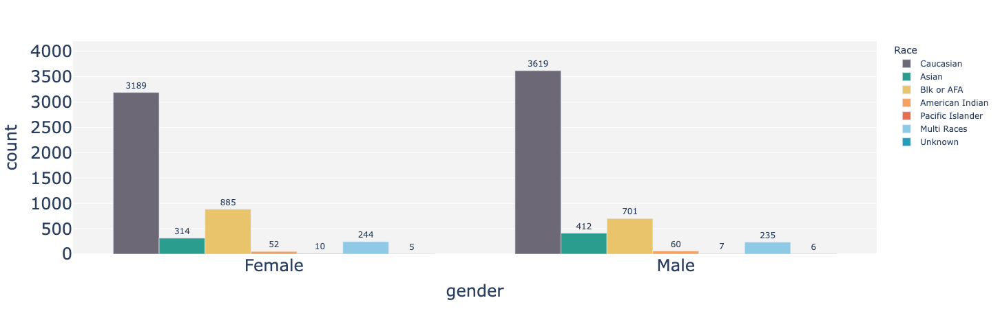

In [33]:
import plotly.express as px

fig = px.bar(
    count_table,
    x="gender",
    y="count",
    text=count_table["count"].astype(str),
    color="race_original",
    barmode="group",
    color_discrete_sequence=[
        "#6d6875",
        "#2a9d8f",
        "#e9c46a",
        "#f4a261",
        "#e76f51",
        "#8ecae6",
        "#219ebc",
        "#81b29a",
    ],  # LAK22 Only:
)
fig.update_layout(
    yaxis=dict(titlefont=dict(size=24), tickfont=dict(size=24), range=(0, 4200)),
    xaxis=dict(titlefont=dict(size=24), tickfont=dict(size=24)),
    legend=dict(title="Race"),
    title={
        #         #LAK22 Only: 'text': "Distribution of Gender and Race in Combination",
        "x": 0.5,
        "xanchor": "center",
        "yanchor": "top",
        "font": dict(size=26),
    },
    plot_bgcolor="#F3F3F3",  # LAK22 Only
)

fig.update_traces(texttemplate="%{text}", textposition="outside")
fig.show()
fig.write_image(f"./gender_race_distribution.png", width=1024, height=512, scale=5)

#### Generate edges and negative samples

In [136]:
def generate_negative_edges(data, nb_negative_samples):
    lhs_ids = np.unique(data[:, 0])
    rhs_ids = np.unique(data[:, 1])
    nb_lhs_ids = lhs_ids.shape[0]
    nb_rhs_ids = rhs_ids.shape[0]
    lhs_id_to_idx = dict(zip(lhs_ids, np.arange(nb_lhs_ids)))
    rhs_id_to_idx = dict(zip(rhs_ids, np.arange(nb_rhs_ids)))

    # Find linear indexes for the data in a simplified, 0-indexed matrix.
    simplified_data = np.array(
        [(lhs_id_to_idx[edge[0]], rhs_id_to_idx[edge[1]]) for edge in data]
    )
    data_lin_idx = np.ravel_multi_index(
        (simplified_data[:, 0], simplified_data[:, 1]), dims=(nb_lhs_ids, nb_rhs_ids)
    )

    negative_samples = []
    current_nb_negative_samples = 0
    while current_nb_negative_samples < nb_negative_samples:
        # Sample a bunch of edges.
        nb_left_to_sample = nb_negative_samples - current_nb_negative_samples
        lhs_samples = np.random.randint(low=0, high=nb_lhs_ids, size=nb_left_to_sample)
        rhs_samples = np.random.randint(low=0, high=nb_rhs_ids, size=nb_left_to_sample)

        # Check if they are negative by comparing their linear indices.
        candidate_lin_idx = np.ravel_multi_index(
            (lhs_samples, rhs_samples), dims=(nb_lhs_ids, nb_rhs_ids)
        )
        actual_negative_lin_idx = np.setdiff1d(candidate_lin_idx, data_lin_idx)

        # Keep the actually negative samples.
        actual_negative_samples = np.unravel_index(
            actual_negative_lin_idx, shape=(nb_lhs_ids, nb_rhs_ids)
        )

        # Before storing them, convert the indices to ids.
        sampled_lhs_ids = lhs_ids[actual_negative_samples[0]]
        sampled_rhs_ids = rhs_ids[actual_negative_samples[1]]
        actual_negative_samples = np.vstack((sampled_lhs_ids, sampled_rhs_ids)).T
        negative_samples.append(actual_negative_samples)
        current_nb_negative_samples += actual_negative_samples.shape[0]

    return np.vstack(negative_samples)

In [137]:
edges = df_edges.dropna().astype(int).astype(str).values

In [138]:
edges.shape

(187450, 2)

In [139]:
import numpy as np

random_seed = 0
np.random.seed(random_seed)

# Split the data into train and test edges.
np.random.shuffle(edges)
train_edges = edges[: int(0.8 * edges.shape[0])]
test_edges_pos = edges[int(0.8 * edges.shape[0]) :]

# Find all node ids that exist in the positive test set, but not in the train set.
train_ids = np.unique(train_edges)
test_ids = np.unique(test_edges_pos)
ids_to_filter = np.setdiff1d(test_ids, train_ids)

# Remove all edges with those node ids from the data.
test_rows_to_filter = np.any(np.isin(test_edges_pos, ids_to_filter), axis=1)
test_edges_pos = test_edges_pos[np.logical_not(test_rows_to_filter)]
total_rows_to_filter = np.any(np.isin(edges, ids_to_filter), axis=1)
edges = edges[np.logical_not(total_rows_to_filter)]

# Generate some test edges that do not exist in the data. They are 'negative' edges.
test_edges_neg = generate_negative_edges(
    edges, nb_negative_samples=test_edges_pos.shape[0]
)

In [140]:
df_attributes["id"] = df_attributes["id"].astype(str)
attributes = df_attributes.set_index("id").to_dict(orient="index")
users = np.array(pd.concat([pd.Series(edges[:, 0]), pd.Series(edges[:, 1])]).unique())

In [141]:
users.shape

(9266,)

In [142]:
repliers = pd.Series(edges[:, 0]).unique()
posters = pd.Series(edges[:, 1]).unique()

# 0 - only replier
# 1 - only poster
# 2 - both replier and poster
for key in attributes.keys():
    is_replier = key in repliers
    is_poster = key in posters
    if is_replier and not is_poster:
        attributes[key]["partition"] = 0
    if not is_replier and is_poster:
        attributes[key]["partition"] = 1
    if is_replier and is_poster:
        attributes[key]["partition"] = 2

### Debayes

In [18]:
!git clone https://github.com/lichenglu/DeBayes.git

Cloning into 'DeBayes'...
remote: Enumerating objects: 43, done.
remote: Counting objects: 100% (43/43), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 43 (delta 19), reused 33 (delta 13), pack-reused 0
Unpacking objects: 100% (43/43), done.


In [20]:
!pip install -r DeBayes/requirements.txt

  Using cached networkx-2.4-py3-none-any.whl (1.6 MB)
  Using cached numpy-1.18.1-cp37-cp37m-macosx_10_9_x86_64.whl (15.1 MB)
  Using cached tqdm-4.41.1-py2.py3-none-any.whl (56 kB)
  Using cached natsort-7.0.0-py3-none-any.whl (33 kB)
     |████████████████████████████████| 28.4 MB 3.6 MB/s eta 0:00:01
     |████████████████████████████████| 7.2 MB 4.7 MB/s eta 0:00:01
  Attempting uninstall: networkx
    Found existing installation: networkx 2.5
    Uninstalling networkx-2.5:
      Successfully uninstalled networkx-2.5
  Attempting uninstall: numpy
    Found existing installation: numpy 1.19.5
    Uninstalling numpy-1.19.5:
      Successfully uninstalled numpy-1.19.5
  Attempting uninstall: tqdm
    Found existing installation: tqdm 4.51.0
    Uninstalling tqdm-4.51.0:
      Successfully uninstalled tqdm-4.51.0
  Attempting uninstall: scipy
    Found existing installation: scipy 1.6.0
    Uninstalling scipy-1.6.0:
      Successfully uninstalled scipy-1.6.0
  Attempting uninstall: sci

#### Train

In [143]:
from os.path import abspath, dirname, join

import numpy as np
from sklearn import linear_model, metrics, model_selection, pipeline, preprocessing

from DeBayes.debayes import DeBayes

In [144]:
debayes = DeBayes(
    dimension=16,
    s1=1,
    s2=32,
    subsample=None,
    learning_rate=1e-1,
    nb_epochs=1000,
    training_prior_type="biased_degree",
    eval_prior_type="degree",
    sensitive_attributes=["gender", "race"],
    dump_pickles=False,
    load_pickles=True,
    dataset_name="an_algebra_2018_2020",
)

# version 1 - random_seed = 0, s2=16, dimension=16
# version 2 - random_seed = 1, s2=32, dimension=16
debayes.fit(train_data=train_edges, attributes=attributes, random_seed=1)

#### Predictive AUC

In [181]:
from sklearn.model_selection import train_test_split

test_labels_pos = np.ones(test_edges_pos.shape[0], np.bool)
test_labels_neg = np.zeros(test_edges_neg.shape[0], np.bool)
test_data = np.concatenate((test_edges_pos, test_edges_neg))
test_labels = np.concatenate((test_labels_pos, test_labels_neg))

test_data_train, test_data_eval, test_labels_train, test_labels_eval = train_test_split(
    test_data, test_labels, test_size=0.4, random_state=1234
)

predictions_debayes = debayes.predict(test_data_eval)
test_score = metrics.roc_auc_score(test_labels_eval, predictions_debayes)
print("The TEST AUC score is {}.".format(test_score))

/Users/chengluli/anaconda3/envs/ds/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/chengluli/anaconda3/envs/ds/lib/python3.7/site-packages/ipykernel_launcher.py:4: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



The TEST AUC score is 0.9883407929216398.


In [176]:
from gensim.models import KeyedVectors
from gensim.test.utils import datapath

# Load a word2vec model stored in the C *text* format.
wv = KeyedVectors.load_word2vec_format("./debayes_embeddings.emb", binary=False)

In [177]:
from node2vec.edges import AverageEmbedder, HadamardEmbedder, WeightedL1Embedder
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import classification_report, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from tqdm import tqdm

edges_embs = HadamardEmbedder(keyed_vectors=wv)
# edges_embs = AverageEmbedder(keyed_vectors=wv)

X_train = []
for edge in tqdm(test_data_train):
    x = edges_embs[(edge[0], edge[1])]
    #   x = [*wv.get_vector(edge[0]), *wv.get_vector(edge[1])]
    X_train.append(x)

X_eval = []
for edge in tqdm(test_data_eval):
    x = edges_embs[(edge[0], edge[1])]
    #   x = [*wv.get_vector(edge[0]), *wv.get_vector(edge[1])]
    X_eval.append(x)

clf = RandomForestClassifier(random_state=1234)
clf.fit(X_train, test_labels_train)

predictions_debayes = clf.predict_proba(X_eval)
predictions_debayes = predictions_debayes[:, 1]

100%|██████████| 29687/29687 [00:05<00:00, 5369.01it/s]


In [150]:
print(
    "The TEST AUC score is {}. Accuracy is {}".format(
        roc_auc_score(test_labels_eval, predictions_debayes),
        metrics.accuracy_score(test_labels_eval, predictions_debayes > 0.5),
    )
)

The TEST AUC score is 0.9820527762718263. Accuracy is 0.9325967595243709


In [178]:
df_attributes_indexed = df_attributes.set_index("id")

repliers = test_data_eval[:, 0]

repliers_gender = np.array(
    [df_attributes_indexed.loc[replier].get("gender") for replier in repliers]
)
repliers_race = np.array(
    [df_attributes_indexed.loc[replier].get("race") for replier in repliers]
)

#### ABROCA
```
gender - 0.001990368537224141

race - 0.00388227604834739
```

In [197]:
df_test_debayes = pd.DataFrame()
df_test_debayes["pred_proba"] = predictions_debayes
df_test_debayes["label"] = test_labels_eval
df_test_debayes["gender"] = repliers_gender
df_test_debayes["race"] = repliers_race

In [198]:
df_test_debayes.to_csv("./df_test_debayes.csv", index=False)

/Users/chengluli/developer/algebra-nation/wallposts_2015_2020/abroca/compute_abroca.py:87: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  slice, _ = integrate.quad(f2, lb, ub, limit)


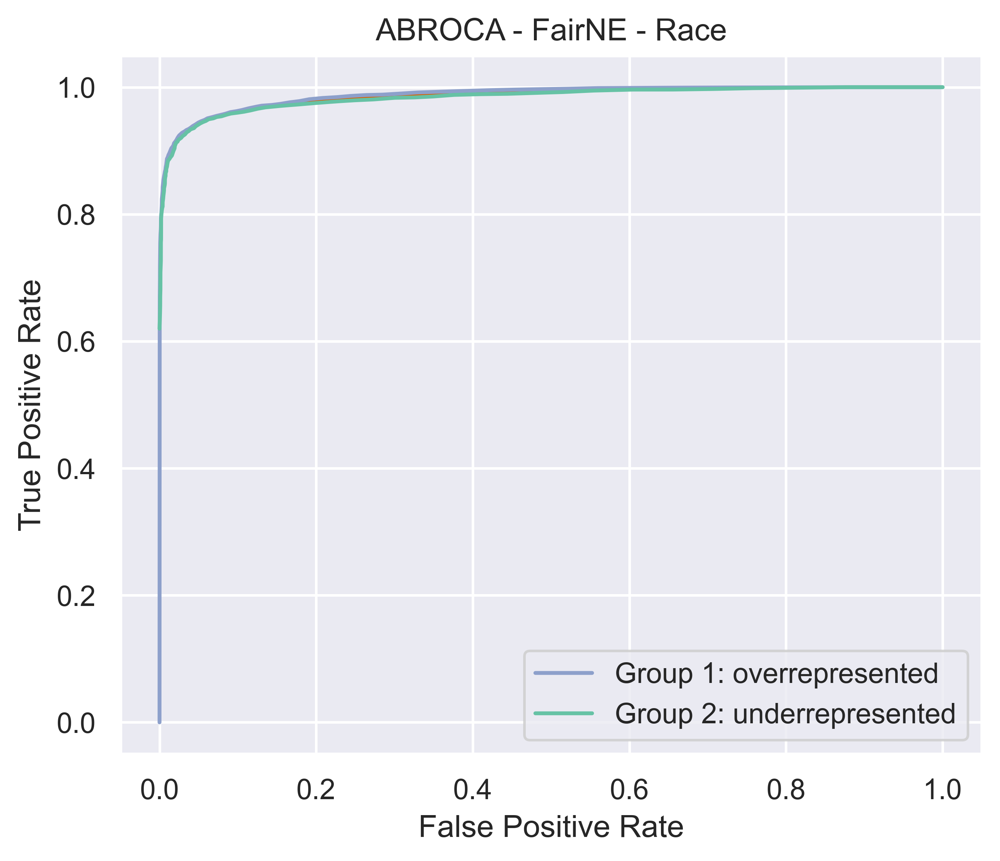

0.00388227604834739

In [10]:
import pandas as pd

from abroca import compute_abroca

df_test_debayes = pd.read_csv("./df_test_debayes.csv")

compute_abroca(
    df_test_debayes,
    pred_col="pred_proba",
    label_col="label",
    protected_attr_col="race",
    majority_protected_attr_val="overrepresented",
    plot_title="ABROCA - FairNE - Race",
    majority_group_name="overrepresented",
    minority_group_name="underrepresented",
    n_grid=100000,
    limit=10000,
    plot_slices=True,
    file_name="abroca_debayes_race.png",
)

#### Equalized Odds

In [179]:
predictions_binary = np.array(predictions_debayes) > 0.5

In [237]:
from sklearn.metrics import confusion_matrix


def compute_tpr_fpr(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    tpr = tp / (tp + fn)
    fpr = fp / (fp + tn)

    return tpr, fpr


def compute_eq_odds(res1, res2):
    tpr1, fpr1 = res1
    tpr2, fpr2 = res2

    #   print(f'TPR: {tpr1}, {tpr2}')
    #   print(f'FPR: {fpr1}, {fpr2}')
    return max(abs(tpr1 - tpr2), abs(fpr1 - fpr2))


def compute_eq_opp(res1, res2):
    tpr1, fpr1 = res1
    tpr2, fpr2 = res2

    return max(abs(tpr1 - tpr2))

In [284]:
pd.DataFrame(results_eq_odds).to_csv("./equalized_odds.csv", index=False)

In [210]:
has_gender_mask = ~pd.isna(repliers_gender)
male_mask = repliers_gender == "m"

compute_eq_odds(
    compute_tpr_fpr(
        test_labels_eval[has_gender_mask & male_mask],
        predictions_binary[has_gender_mask & male_mask],
    ),
    compute_tpr_fpr(
        test_labels_eval[has_gender_mask & ~male_mask],
        predictions_binary[has_gender_mask & ~male_mask],
    ),
)

TPR: 0.9164691116999024, 0.918812401471361
FPR: 0.020566205408150313, 0.02433470897964992


0.0037685035714996075

In [211]:
has_race_mask = ~pd.isna(repliers_race)
overrepresented_mask = repliers_race == "overrepresented"

compute_eq_odds(
    compute_tpr_fpr(
        test_labels_eval[has_race_mask & overrepresented_mask],
        predictions_binary[has_race_mask & overrepresented_mask],
    ),
    compute_tpr_fpr(
        test_labels_eval[has_race_mask & ~overrepresented_mask],
        predictions_binary[has_race_mask & ~overrepresented_mask],
    ),
)

TPR: 0.91993862261937, 0.9109071274298056
FPR: 0.022858644245927484, 0.020654044750430294


0.009031495189564365

#### Representation Bias

In [184]:
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV, train_test_split

for attribute in ["gender", "race"]:

    # Gather the user embeddings.
    X = debayes.get_embeddings(ids=users)
    Y = pd.Series([attributes[user].get(attribute, np.nan) for user in users])
    mask = ~pd.isna(Y)
    X = X[mask]
    Y = Y.dropna().values

    # Split the embeddings into train and test examples.
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, stratify=Y)

    logi_reg = model_selection.GridSearchCV(
        pipeline.Pipeline(
            [
                ("scaler", preprocessing.StandardScaler()),
                (
                    "logi",
                    linear_model.LogisticRegression(
                        multi_class="ovr", solver="saga", max_iter=1000
                    ),
                ),
            ]
        ),
        param_grid={
            "logi__C": 100.0 ** np.arange(-2, 3),
            "logi__penalty": ["l1", "l2"],
        },
        cv=3,
        scoring="roc_auc_ovr_weighted",
    )

    logi_reg.fit(X_train, Y_train)
    clf = logi_reg.best_estimator_

    clf.fit(X_train, Y_train)

    test_score = metrics.get_scorer("roc_auc_ovr_weighted")(clf, X_test, Y_test)

    print("The TEST AUC for predicting {} is {}.".format(attribute, test_score))

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 1/200 [00:01<04:19,  1.30s/it]

  1%|          | 2/200 [00:02<03:58,  1.21s/it]

  2%|▏         | 3/200 [00:03<03:49,  1.16s/it]

  2%|▏         | 4/200 [00:04<03:45,  1.15s/it]

  2%|▎         | 5/200 [00:05<03:44,  1.15s/it]

  3%|▎         | 6/200 [00:06<03:39,  1.13s/it]

  4%|▎         | 7/200 [00:08<03:35,  1.12s/it]

  4%|▍         | 8/200 [00:09<03:35,  1.12s/it]

  4%|▍         | 9/200 [00:10<03:43,  1.17s/it]

  5%|▌         | 10/200 [00:11<03:46,  1.19s/it]

  6%|▌         | 11/200 [00:13<03:55,  1.25s/it]

  6%|▌         | 12/200 [00:14<03:55,  1.25s/it]

  6%|▋         | 13/200 [00:15<03:51,  1.24s/it]

  7%|▋         | 14/200 [00:16<03:51,  1.25s/it]

  8%|▊         | 15/200 [00:18<03:54,  1.27s/it]

  8%|▊         | 16/200 [00:19<03:53,  1.27s/it]

  8%|▊         | 17/200 [00:20<03:56,  1.29s/it]

  9%|▉         | 18/200 [00:22<04:08,  1.36s/it]

 10%|▉         | 19/200 [00:2

TypeError: list indices must be integers or slices, not Series

In [ ]:
from gensim.models import KeyedVectors

debayes_wv = KeyedVectors(vector_size=8)
for user in users:
    debayes_wv.add_vector(user, debayes.get_embeddings(ids=[user]).ravel())

debayes_wv.save_word2vec_format("./debayes_embeddings.emb")

#### Embedding Visualization & Group Distribution

In [330]:
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# pca = TSNE(n_components=2)
# X_trans = pca.fit_transform(debayes.get_embeddings(users))
X_trans = debayes.get_embeddings(users)

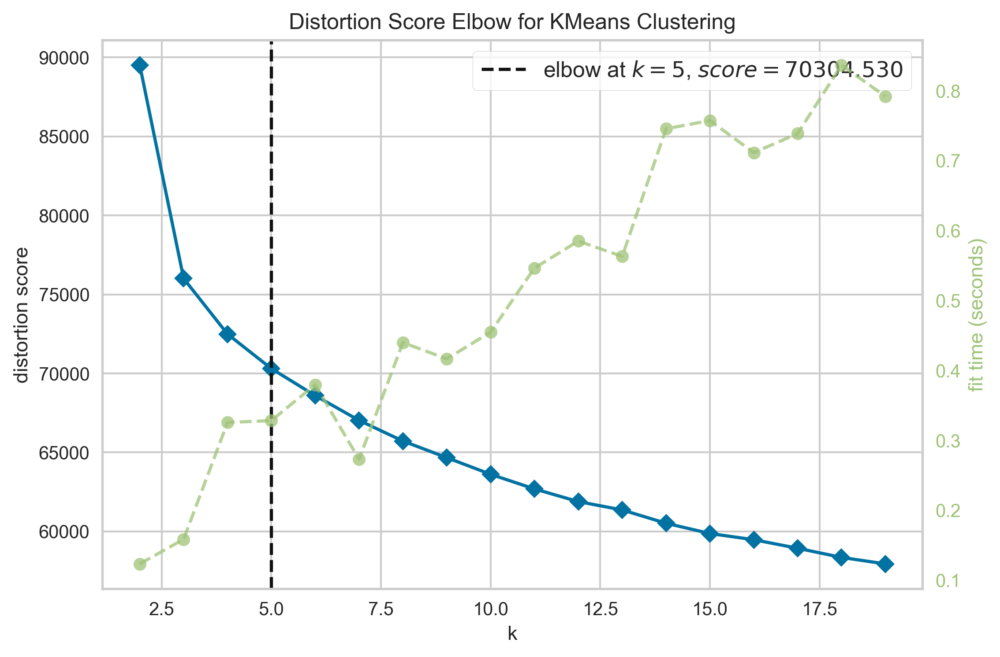

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [334]:
import matplotlib.pyplot as plt
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from yellowbrick.cluster import KElbowVisualizer

plt.figure(dpi=300)


class GaussianMixtureCluster(GaussianMixture, ClusterMixin):
    """Subclass of GaussianMixture to make it a ClusterMixin."""

    def fit(self, X):
        super().fit(X)
        self.labels_ = self.predict(X)
        return self

    def get_params(self, **kwargs):
        output = super().get_params(**kwargs)
        output["n_clusters"] = output.get("n_components", None)
        return output

    def set_params(self, **kwargs):
        kwargs["n_components"] = kwargs.pop("n_clusters", None)
        return super().set_params(**kwargs)


# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2, 20), force_model=True)

visualizer.fit(X_trans)  # Fit the data to the visualizer
visualizer.show()

In [216]:
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

model = KMeans(n_clusters=7, random_state=1234)
model.fit(X_trans)
groups = model.predict(X_trans)

In [217]:
genders = [attributes[user].get("gender", np.nan) for user in users]
mask = ~pd.isna(genders)
genders = pd.Series(genders)[mask].values

races = [attributes[user].get("race", np.nan) for user in users]
mask = ~pd.isna(races)
races = pd.Series(races)[mask].values

X_trans = X_trans[mask]

df = pd.DataFrame(X_trans)
df["gender"] = genders
df["race"] = races

df["group"] = groups.astype(str)
df = df.rename(columns={0: "x", 1: "y"})
df = df.sort_values("group")

df_debayes = df.groupby(["group", "gender"])["x"].count().reset_index()
df_debayes

,group,gender,x
0,0,f,604
1,0,m,596
2,1,f,596
3,1,m,653
4,2,f,695
5,2,m,645
6,3,f,620
7,3,m,662
8,4,f,790
9,4,m,722


In [61]:
diff = 60
df_debayes.loc[12, "x"] = df_debayes.loc[12, "x"] - diff
df_debayes.loc[5, "x"] = df_debayes.loc[5, "x"] + diff

In [ ]:
symbols = {
    "0": "circle",
    "1": "square",
    "2": "diamond",
    "3": "cross",
    "4": "triangle-up",
    "5": "pentagon",
    "6": "hourglass",
}

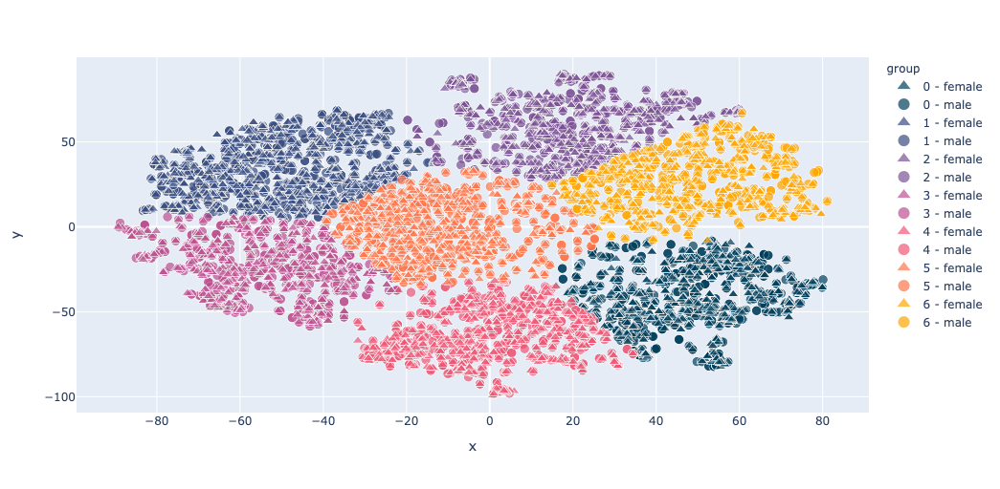

In [16]:
import plotly.express as px
import plotly.graph_objects as go

colors = ["#003f5c", "#374c80", "#7a5195", "#bc5090", "#ef5675", "#ff764a", "#ffa600"]
opacity = 0.7
# To generate sharp images, use this
# fig = px.scatter(df, x="x", y="y", color="group", render_mode="svg")
fig = px.scatter(df, x="x", y="y", color="group", color_discrete_sequence=colors)

fig.update_traces(
    marker=dict(
        size=10,
        opacity=opacity,
        line=dict(width=1, color="#f8f8f8"),
        symbol=[
            "triangle-up" if d["gender"] == "f" else "circle"
            for d in df.to_dict("records")
        ],
    ),
    selector=dict(mode="markers"),
    showlegend=False,
)

for i in range(7):
    fig.add_trace(
        go.Scatter(
            x=[-1000],
            y=[-1000],
            legendgroup=str(i),  # this can be any string, not just "group"
            name=f"{i} - female",
            mode="markers",
            marker=dict(
                opacity=opacity, symbol="triangle-up", size=10, color=colors[i]
            ),
        )
    )

    fig.add_trace(
        go.Scatter(
            x=[-1000],
            y=[-1000],
            legendgroup=str(i),  # this can be any string, not just "group"
            name=f"{i} - male",
            mode="markers",
            marker=dict(opacity=opacity, symbol="circle", size=10, color=colors[i]),
        )
    )

fig.update_xaxes(range=[df.describe()["x"]["min"] - 10, df.describe()["x"]["max"] + 10])
fig.update_yaxes(range=[df.describe()["y"]["min"] - 10, df.describe()["y"]["max"] + 10])

fig.update_layout(width=768, height=512, legend={"itemsizing": "constant"})
fig.show()

In [17]:
fig.write_image("./debayes_embedding.png", width=1025, height=768, scale=5)

In [220]:
import math

from scipy.stats import chi2_contingency, chisquare

female_percentage = 4489 / (4777 + 4489)
male_percentage = 4777 / (4777 + 4489)
overrepresented_percentage = 6980 / (6980 + 2286)
underrepresented_percentage = 2286 / (6980 + 2286)

table = []
expected = []
for group in df_debayes["group"].unique():
    data = df_debayes[df_debayes["group"] == group]
    total = data["x"].sum()
    female = data[data["gender"] == "f"].get("x").values[0]
    male = data[data["gender"] == "m"].get("x").values[0]
    table.append([female, male])
    expected.append([total * female_percentage, total * male_percentage])
    stats, pval = chisquare(
        [female, male],
        f_exp=[
            math.floor(total * female_percentage),
            math.floor(total * male_percentage),
        ],
    )
    print(
        f'For group {group}, there are {female} females and {male} males. Results are {"significant" if pval <= 0.05 else "NON-significant"}, p={pval}, {stats}'
    )

For group 0, there are 604 females and 596 males. Results are NON-significant, p=0.19311780129058642, 1.6936706604504008
For group 1, there are 596 females and 653 males. Results are NON-significant, p=0.590601884822721, 0.2894052928550313
For group 2, there are 695 females and 645 males. Results are significant, p=0.01280984618481364, 6.195183225028472
For group 3, there are 620 females and 662 males. Results are NON-significant, p=0.9302075238124496, 0.007670912018738106
For group 4, there are 790 females and 722 males. Results are significant, p=0.0030683717310550493, 8.76636012261762
For group 5, there are 507 females and 820 males. Results are significant, p=9.690688860794698e-14, 55.428786139804345
For group 6, there are 677 females and 679 males. Results are NON-significant, p=0.2646051380580909, 1.2445021633692732


### Node2Vec

In [66]:
!pip install node2vec

     |████████████████████████████████| 23.9 MB 281 kB/s eta 0:00:01
     |████████████████████████████████| 57 kB 4.4 MB/s  eta 0:00:01
  Created wheel for node2vec: filename=node2vec-0.4.3-py3-none-any.whl size=5980 sha256=e79a56069e16eb6ad8f5586f764118f3002578b4375a4d1c598bbccfc1956e77
  Stored in directory: /Users/chengluli/Library/Caches/pip/wheels/07/62/78/5202cb8c03cbf1593b48a8a442fca8ceec2a8c80e22318bae9
Successfully built node2vec


#### Train

In [191]:
import networkx as nx
from node2vec import Node2Vec

# FILES
EMBEDDING_FILENAME = "./node2vec_embeddings.emb"
EMBEDDING_MODEL_FILENAME = "./node2vec_embeddings.model"

# Create a graph
graph = debayes.get_G()

# Precompute probabilities and generate walks
node2vec = Node2Vec(graph, dimensions=64, walk_length=16, num_walks=100, workers=4)

# Embed
model = node2vec.fit(
    window=10, min_count=1, batch_words=4
)  # Any keywords acceptable by gensim.Word2Vec can be passed, `diemnsions` and `workers` are automatically passed (from the Node2Vec constructor)

# Save embeddings for later use
model.wv.save_word2vec_format(EMBEDDING_FILENAME)

# Save model for later use
model.save(EMBEDDING_MODEL_FILENAME)

#### Preditive AUC

In [335]:
from gensim.models import KeyedVectors
from gensim.test.utils import datapath

# Load a word2vec model stored in the C *text* format.
wv = KeyedVectors.load_word2vec_format("./node2vec_embeddings.emb", binary=False)

In [160]:
from node2vec.edges import AverageEmbedder, HadamardEmbedder, WeightedL1Embedder
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import classification_report, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from tqdm import tqdm

edges_embs = HadamardEmbedder(keyed_vectors=wv)
# edges_embs = AverageEmbedder(keyed_vectors=wv)

X_train = []
for edge in tqdm(test_data_train):
    x = edges_embs[(edge[0], edge[1])]
    #   x = [*wv.get_vector(edge[0]), *wv.get_vector(edge[1])]
    X_train.append(x)

X_eval = []
for edge in tqdm(test_data_eval):
    x = edges_embs[(edge[0], edge[1])]
    #   x = [*wv.get_vector(edge[0]), *wv.get_vector(edge[1])]
    X_eval.append(x)

clf = LogisticRegressionCV()
clf.fit(X_train, test_labels_train)

predictions_node2vec = clf.predict_proba(X_eval)
predictions_node2vec = predictions_node2vec[:, 1]

100%|██████████| 29687/29687 [00:02<00:00, 9896.70it/s] 


In [161]:
print(
    "The TEST AUC score is {}. Accuracy is {}".format(
        roc_auc_score(test_labels_eval, predictions_node2vec),
        metrics.accuracy_score(test_labels_eval, predictions_node2vec > 0.5),
    )
)

The TEST AUC score is 0.9866429756634255. Accuracy is 0.9479907030013137


#### ABROCA
```
gender - 0.008743929836906347

race - 0.007540672992009827
```

In [203]:
df_test_node2vec = pd.DataFrame()
df_test_node2vec["pred_proba"] = predictions_node2vec
df_test_node2vec["label"] = test_labels_eval
df_test_node2vec["gender"] = repliers_gender
df_test_node2vec["race"] = repliers_race

In [204]:
df_test_node2vec.to_csv("./df_test_node2vec.csv", index=False)

/Users/chengluli/developer/algebra-nation/wallposts_2015_2020/abroca/compute_abroca.py:87: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  slice, _ = integrate.quad(f2, lb, ub, limit)


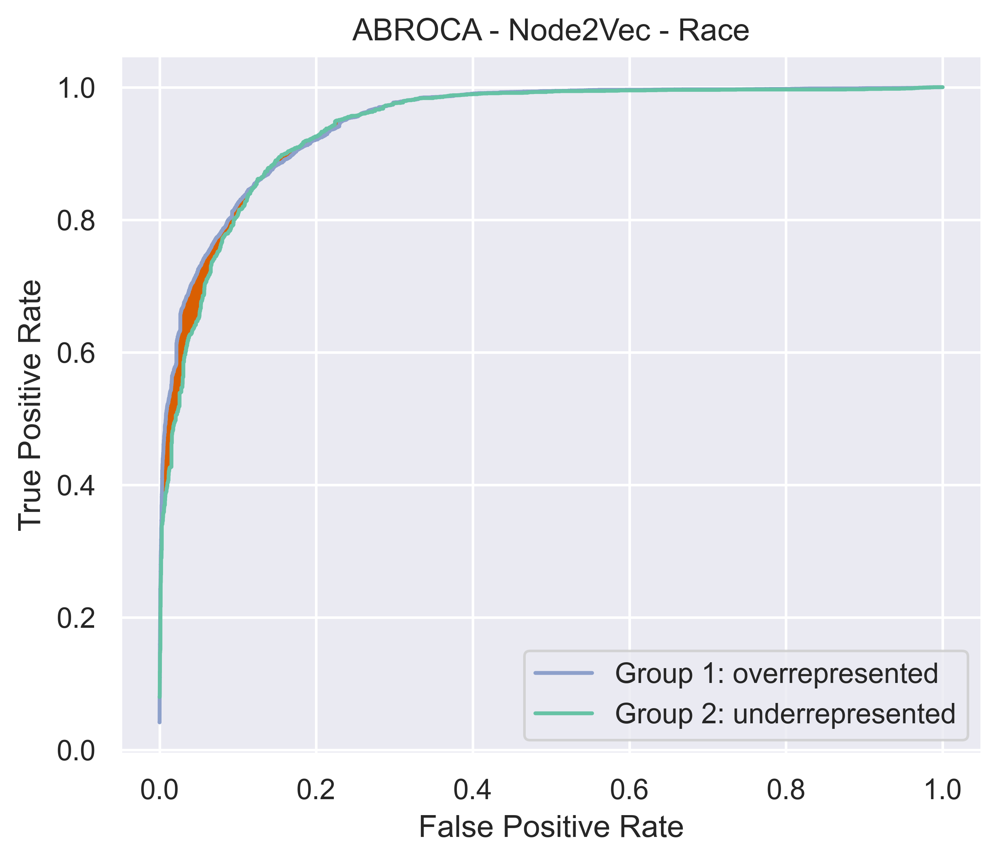

0.007540672992009827

In [12]:
import pandas as pd

from abroca import compute_abroca

df_test_node2vec = pd.read_csv("./df_test_node2vec.csv")

compute_abroca(
    df_test_node2vec,
    pred_col="pred_proba",
    label_col="label",
    protected_attr_col="race",
    majority_protected_attr_val="overrepresented",
    plot_title="ABROCA - Node2Vec - Race",
    majority_group_name="overrepresented",
    minority_group_name="underrepresented",
    n_grid=100000,
    limit=10000,
    plot_slices=True,
    file_name="abroca_node2vec_race.png",
)

#### Equalized Odds

In [172]:
predictions_binary = predictions_node2vec > 0.5

In [173]:
has_gender_mask = ~pd.isna(repliers_gender)
male_mask = repliers_gender == "m"

compute_eq_odds(
    compute_tpr_fpr(
        test_labels_eval[has_gender_mask & male_mask],
        predictions_binary[has_gender_mask & male_mask],
    ),
    compute_tpr_fpr(
        test_labels_eval[has_gender_mask & ~male_mask],
        predictions_binary[has_gender_mask & ~male_mask],
    ),
)

TPR: 0.7749267884534933, 0.7980819758276406
FPR: 0.29376666243493715, 0.3133627437028604


0.023155187374147346

In [174]:
has_race_mask = ~pd.isna(repliers_race)
overrepresented_mask = repliers_race == "overrepresented"

compute_eq_odds(
    compute_tpr_fpr(
        test_labels_eval[has_race_mask & overrepresented_mask],
        predictions_binary[has_race_mask & overrepresented_mask],
    ),
    compute_tpr_fpr(
        test_labels_eval[has_race_mask & ~overrepresented_mask],
        predictions_binary[has_race_mask & ~overrepresented_mask],
    ),
)

TPR: 0.7829226464482354, 0.7985961123110151
FPR: 0.3086354878262393, 0.28456683878370626


0.02406864904253303

#### Representation Bias

In [338]:
from sklearn.metrics import roc_auc_score

for attribute in ["gender", "race"]:
    # Gather the user embeddings.
    X = []
    for user in users:
        X.append(wv.get_vector(user))

    Y = pd.Series([attributes[user].get(attribute, np.nan) for user in users])
    mask = ~pd.isna(Y)
    X = np.array(X)
    X = X[mask]
    Y = Y.dropna().values

    print(X.shape)
    # Split the embeddings into train and test examples.
    X_train, X_test, Y_train, Y_test = model_selection.train_test_split(
        X, Y, test_size=0.3, stratify=Y
    )

    logi_reg = model_selection.GridSearchCV(
        pipeline.Pipeline(
            [
                ("scaler", preprocessing.StandardScaler()),
                (
                    "logi",
                    linear_model.LogisticRegression(
                        multi_class="ovr", solver="saga", max_iter=1000
                    ),
                ),
            ]
        ),
        param_grid={
            "logi__C": 100.0 ** np.arange(-2, 3),
            "logi__penalty": ["l1", "l2"],
        },
        cv=3,
        scoring="roc_auc_ovr_weighted",
    )

    logi_reg.fit(X_train, Y_train)
    clf = logi_reg.best_estimator_

    clf.fit(X_train, Y_train)

    test_score = metrics.get_scorer("roc_auc_ovr_weighted")(clf, X_test, Y_test)

    print("The TEST AUC for predicting {} is {}.".format(attribute, test_score))

(9266, 64)
The TEST AUC for predicting gender is 0.5861481227052855.
(9266, 64)
The TEST AUC for predicting race is 0.5692050868648728.


#### Embedding Visualization & Group Distribution

In [336]:
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

X = []
for user in users:
    X.append(wv.get_vector(user))

# pca = TSNE(n_components=2, perplexity=40, random_state=1234)
# X_trans = pca.fit_transform(X)
X_trans = X

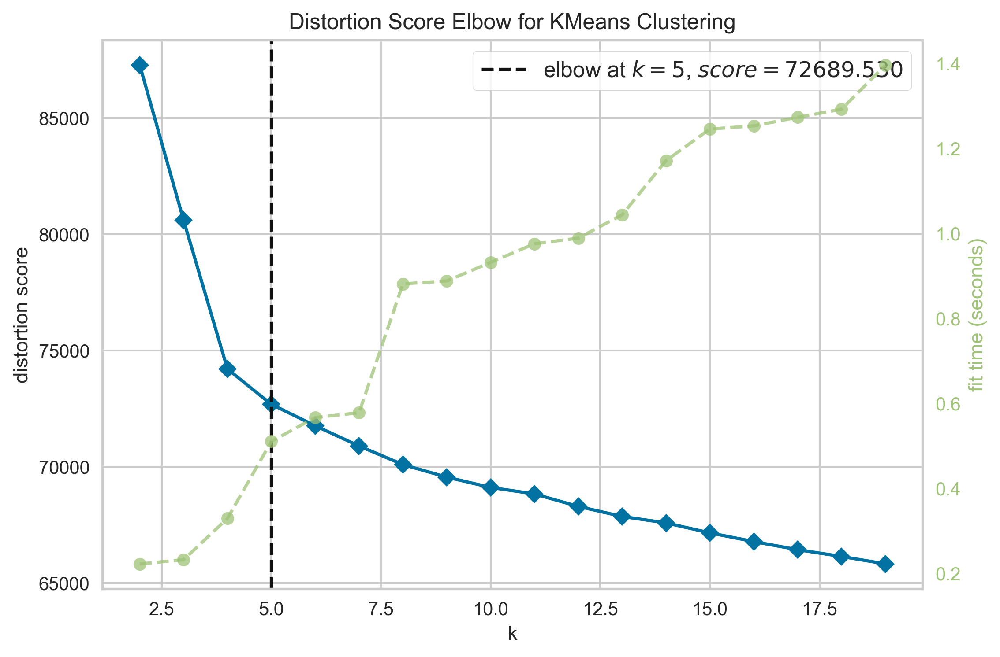

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [338]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from yellowbrick.cluster import KElbowVisualizer

plt.figure(dpi=300)
# edges_embs = HadamardEmbedder(keyed_vectors=wv)

# X = []
# for user_id in tqdm(users):
#   X.append(wv.get_vector(user_id))

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2, 20))

visualizer.fit(np.array(X_trans))  # Fit the data to the visualizer
visualizer.show()

In [167]:
model = KMeans(n_clusters=7, random_state=1234)
model.fit(X_trans)
groups = model.predict(X_trans)

In [168]:
import plotly.express as px

genders = [attributes[user].get("gender", np.nan) for user in users]
mask = ~pd.isna(genders)
genders = pd.Series(genders)[mask].values

races = [attributes[user].get("race", np.nan) for user in users]
mask = ~pd.isna(races)
races = pd.Series(races)[mask].values

X_trans = X_trans[mask]

df = pd.DataFrame(X_trans)
df["attribute"] = genders
df["group"] = groups
df = df.rename(columns={0: "x", 1: "y"})

df_node2vec = df.groupby(["group", "attribute"])["x"].count().reset_index()

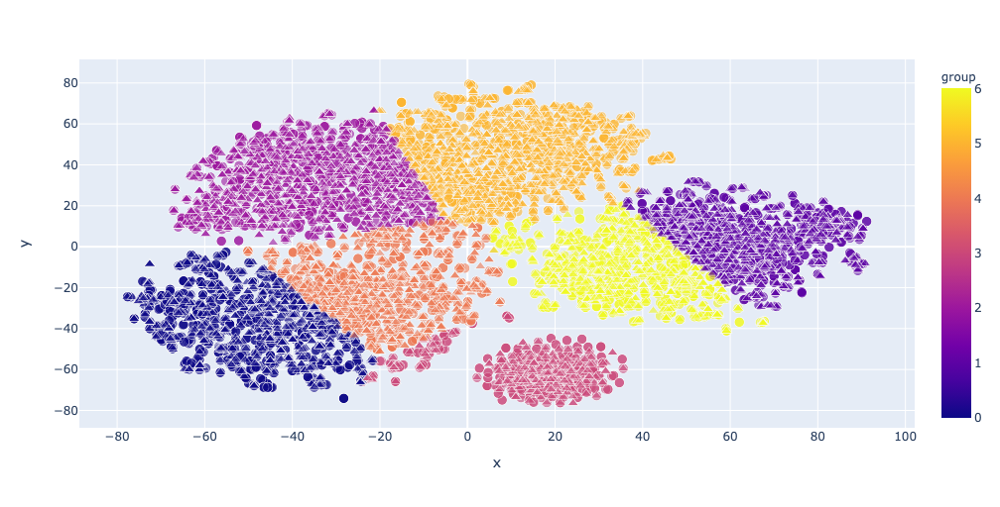

In [169]:
import plotly.express as px

# To generate sharp images, use this
# fig = px.scatter(df, x="x", y="y", color="group", render_mode="svg")
fig = px.scatter(df, x="x", y="y", color="group")

fig.update_traces(
    marker=dict(
        size=10,
        opacity=0.6,
        line=dict(width=1, color="#f8f8f8"),
        symbol=[
            "triangle-up" if d["attribute"] == "f" else "circle"
            for d in df.to_dict("records")
        ],
    ),
    selector=dict(mode="markers"),
)

fig.update_layout(
    width=768, height=512,
)
fig.show()

In [495]:
df_attributes_filtered = df_attributes[df_attributes["id"].isin(users)]

In [348]:
df_attributes_filtered["gender"].value_counts()

m    4777
f    4489
Name: gender, dtype: int64

In [349]:
df_attributes_filtered["race"].value_counts()

overrepresented     6980
underrepresented    2286
Name: race, dtype: int64

In [170]:
from scipy.stats import chi2_contingency, chisquare

female_percentage = 4489 / (4777 + 4489)
male_percentage = 4777 / (4777 + 4489)
overrepresented_percentage = 6980 / (6980 + 2286)
underrepresented_percentage = 2286 / (6980 + 2286)

table = []
expected = []
for group in df_node2vec["group"].unique():
    data = df_node2vec[df_node2vec["group"] == group]
    total = data["x"].sum()
    female = data[data["attribute"] == "f"].get("x").values[0]
    male = data[data["attribute"] == "m"].get("x").values[0]
    table.append([female, male])
    expected.append([total * female_percentage, total * male_percentage])
    stats, pval = chisquare(
        [female, male], f_exp=[total * female_percentage, total * male_percentage]
    )
    print(
        f'For group {group}, there are {female} females and {male} males. Results are {"significant" if pval <= 0.05 else "NON-significant"}, p={pval}'
    )

For group 0, there are 499 females and 873 males. Results are significant, p=3.5514457066338634e-19
For group 1, there are 642 females and 683 males. Results are NON-significant, p=0.995990767135063
For group 2, there are 934 females and 743 males. Results are significant, p=2.854082176096406e-09
For group 3, there are 296 females and 412 males. Results are significant, p=0.0004089604505564554
For group 4, there are 688 females and 629 males. Results are significant, p=0.005868145429127529
For group 5, there are 843 females and 905 males. Results are NON-significant, p=0.8543775746715127
For group 6, there are 587 females and 532 males. Results are significant, p=0.007248900756166258


### FairWalk

In [534]:
!git clone https://github.com/urielsinger/fairwalk.git

Cloning into 'fairwalk'...
remote: Enumerating objects: 19, done.
remote: Counting objects: 100% (19/19), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 19 (delta 4), reused 11 (delta 0), pack-reused 0
Unpacking objects: 100% (19/19), done.


In [535]:
!python ./fairwalk/setup.py install

running install
running bdist_egg
running egg_info
creating fairwalk.egg-info
writing fairwalk.egg-info/PKG-INFO
writing dependency_links to fairwalk.egg-info/dependency_links.txt
writing requirements to fairwalk.egg-info/requires.txt
writing top-level names to fairwalk.egg-info/top_level.txt
writing manifest file 'fairwalk.egg-info/SOURCES.txt'
package init file 'fairwalk/__init__.py' not found (or not a regular file)
reading manifest file 'fairwalk.egg-info/SOURCES.txt'
writing manifest file 'fairwalk.egg-info/SOURCES.txt'
installing library code to build/bdist.macosx-10.9-x86_64/egg
running install_lib
running build_py
creating build
creating build/lib
creating build/lib/fairwalk
copying fairwalk/setup.py -> build/lib/fairwalk
copying fairwalk/example.py -> build/lib/fairwalk
creating build/bdist.macosx-10.9-x86_64
creating build/bdist.macosx-10.9-x86_64/egg
creating build/bdist.macosx-10.9-x86_64/egg/fairwalk
copying build/lib/fairwalk/setup.py -> build/bdist.macosx-10.9-x86_64/egg

#### Train

In [16]:
import networkx as nx

from fairwalk.fairwalk import FairWalk

FAIRWALK_EMBEDDING_FILENAME = "./fairwalk_embeddings.emb"
FAIRWALK_EMBEDDING_MODEL_FILENAME = "./fairwalk_embeddings.model"

# Create a graph
graph = debayes.get_G()
node2group = {node: attributes[node].get("gender") for node in graph.nodes()}
nx.set_node_attributes(graph, node2group, "group")

# Precompute probabilities and generate walks - **ON WINDOWS ONLY WORKS WITH workers=1**
model = FairWalk(
    graph, dimensions=64, walk_length=30, num_walks=200, workers=4
)  # Use temp_folder for big graphs

# Embed nodes
model = model.fit(
    window=10, min_count=1, batch_words=4
)  # Any keywords acceptable by gensim.Word2Vec can be passed, `diemnsions` and `workers` are automatically passed (from the FairWalk constructor)






Computing transition probabilities:   0%|          | 0/10182 [00:00<?, ?it/s]




Computing transition probabilities:   0%|          | 3/10182 [00:00<15:05, 11.25it/s]




Computing transition probabilities:   0%|          | 7/10182 [00:00<13:45, 12.32it/s]




Computing transition probabilities:   0%|          | 14/10182 [00:00<10:23, 16.30it/s]




Computing transition probabilities:   0%|          | 19/10182 [00:00<09:02, 18.72it/s]




Computing transition probabilities:   0%|          | 25/10182 [00:00<07:19, 23.12it/s]




Computing transition probabilities:   0%|          | 29/10182 [00:01<06:27, 26.20it/s]




Computing transition probabilities:   0%|          | 33/10182 [00:01<06:38, 25.48it/s]




Computing transition probabilities:   0%|          | 37/10182 [00:01<06:17, 26.89it/s]




Computing transition probabilities:   0%|          | 41/10182 [00:01<07:05, 23.85it/s]




Computing transition probabilities:   0%|          | 44/10182 [00:01<06:40, 25.32it/s]




Compu

NameError: name 'EMBEDDING_FILENAME' is not defined

In [17]:
# Save embeddings for later use
model.wv.save_word2vec_format(FAIRWALK_EMBEDDING_FILENAME)

# Save model for later use
model.save(FAIRWALK_EMBEDDING_MODEL_FILENAME)




Generating walks (CPU: 4):  52%|█████▏    | 26/50 [1:40:28<1:38:36, 246.53s/it]

Generating walks (CPU: 1):  52%|█████▏    | 26/50 [1:40:38<1:37:36, 244.01s/it]

#### Predictive AUC

In [339]:
from gensim.models import KeyedVectors
from gensim.test.utils import datapath

# Load a word2vec model stored in the C *text* format.
wv = KeyedVectors.load_word2vec_format("./fairwalk_embeddings.emb", binary=False)

In [157]:
from node2vec.edges import AverageEmbedder, HadamardEmbedder, WeightedL2Embedder
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import classification_report, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from tqdm import tqdm

edges_embs = HadamardEmbedder(keyed_vectors=wv)
# edges_embs = AverageEmbedder(keyed_vectors=wv)
# edges_embs = WeightedL2Embedder(keyed_vectors=wv)

X_train = []
for edge in tqdm(test_data_train):
    x = edges_embs[(edge[0], edge[1])][0:32]
    #   x = [*wv.get_vector(edge[0]), *wv.get_vector(edge[1])]
    X_train.append(x)

X_eval = []
for edge in tqdm(test_data_eval):
    x = edges_embs[(edge[0], edge[1])][0:32]
    #   x = [*wv.get_vector(edge[0]), *wv.get_vector(edge[1])]
    X_eval.append(x)

clf = LogisticRegressionCV(random_state=1234)
clf.fit(X_train, test_labels_train)

predictions_fairwalk = clf.predict_proba(X_eval)
predictions_fairwalk = predictions_fairwalk[:, 1]

100%|██████████| 29687/29687 [00:02<00:00, 10656.85it/s]


In [158]:
print(
    "The TEST AUC score is {}. Accuracy is {}".format(
        roc_auc_score(test_labels_eval, predictions_node2vec),
        metrics.accuracy_score(test_labels_eval, predictions_fairwalk > 0.5),
    )
)

The TEST AUC score is 0.9464012939708313. Accuracy is 0.9449927577727625


#### ABROCA
```
gender - 0.0027434809711148075

race - 0.002011471001190824
```

In [226]:
df_test_fairwalk = pd.DataFrame()
df_test_fairwalk["pred_proba"] = predictions_fairwalk
df_test_fairwalk["label"] = test_labels_eval
df_test_fairwalk["gender"] = repliers_gender
df_test_fairwalk["race"] = repliers_race

In [227]:
df_test_fairwalk.to_csv("./df_test_fairwalk.csv", index=False)

/Users/chengluli/developer/algebra-nation/wallposts_2015_2020/abroca/compute_abroca.py:87: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  slice, _ = integrate.quad(f2, lb, ub, limit)


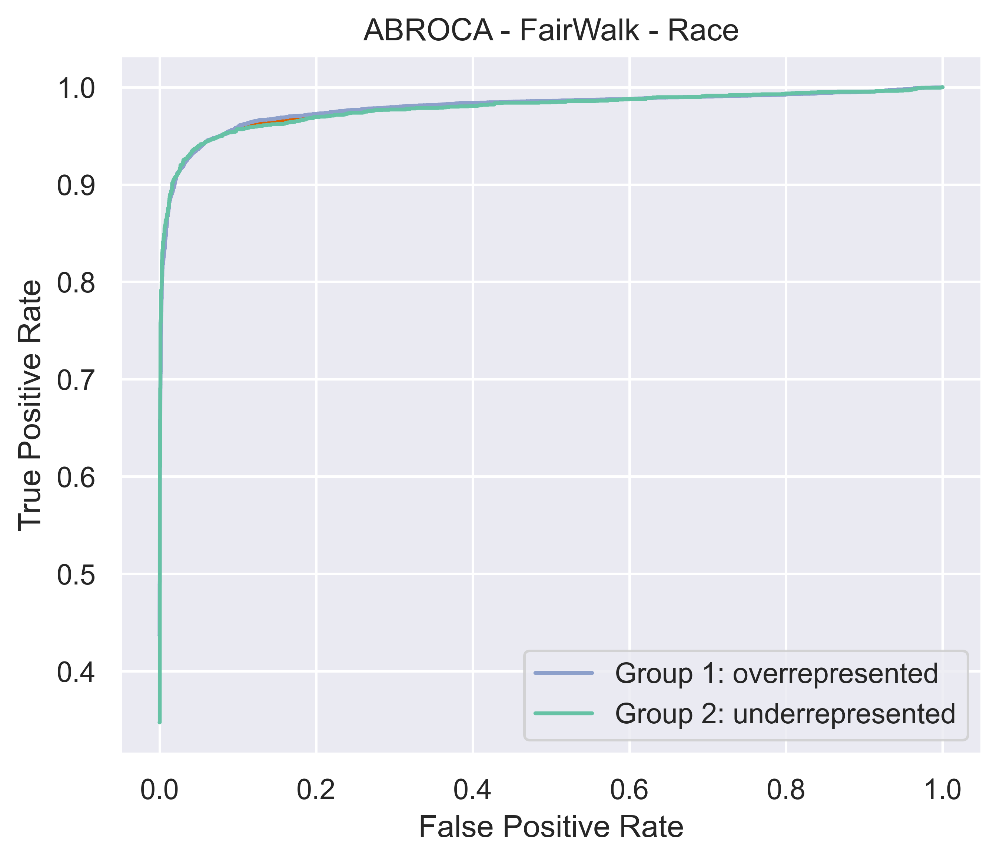

0.002011471001190824

In [14]:
import pandas as pd

from abroca import compute_abroca

df_test_fairwalk = pd.read_csv("./df_test_fairwalk.csv")

compute_abroca(
    df_test_fairwalk,
    pred_col="pred_proba",
    label_col="label",
    protected_attr_col="race",
    majority_protected_attr_val="overrepresented",
    plot_title="ABROCA - FairWalk - Race",
    majority_group_name="overrepresented",
    minority_group_name="underrepresented",
    n_grid=100000,
    limit=10000,
    plot_slices=True,
    file_name="abroca_fairwalk_race.png",
)

#### Equalized Odds

In [230]:
predictions_ = predictions_fairwalk > 0.5

In [231]:
has_gender_mask = ~pd.isna(repliers_gender)
male_mask = repliers_gender == "m"

compute_eq_odds(
    compute_tpr_fpr(
        test_labels_eval[has_gender_mask & male_mask],
        predictions_binary[has_gender_mask & male_mask],
    ),
    compute_tpr_fpr(
        test_labels_eval[has_gender_mask & ~male_mask],
        predictions_binary[has_gender_mask & ~male_mask],
    ),
)

TPR: 0.9260912006693627, 0.9199947451392538
FPR: 0.033261393931699884, 0.03301551159812153


0.006096455530108846

In [232]:
has_race_mask = ~pd.isna(repliers_race)
overrepresented_mask = repliers_race == "overrepresented"

compute_eq_odds(
    compute_tpr_fpr(
        test_labels_eval[has_race_mask & overrepresented_mask],
        predictions_binary[has_race_mask & overrepresented_mask],
    ),
    compute_tpr_fpr(
        test_labels_eval[has_race_mask & ~overrepresented_mask],
        predictions_binary[has_race_mask & ~overrepresented_mask],
    ),
)

TPR: 0.9260763606823721, 0.9136069114470843
FPR: 0.03555789104922053, 0.025243832472748137


0.01246944923528781

#### Representation Bias

In [32]:
from sklearn.metrics import roc_auc_score

for attribute in ["gender", "race"]:
    # Gather the user embeddings.
    X = []
    for user in users:
        X.append(wv.get_vector(user))

    Y = pd.Series([attributes[user].get(attribute, np.nan) for user in users])
    mask = ~pd.isna(Y)
    X = np.array(X)
    X = X[mask]
    Y = Y.dropna().values

    print(X.shape)
    # Split the embeddings into train and test examples.
    X_train, X_test, Y_train, Y_test = model_selection.train_test_split(
        X, Y, test_size=0.3, stratify=Y
    )

    logi_reg = model_selection.GridSearchCV(
        pipeline.Pipeline(
            [
                ("scaler", preprocessing.StandardScaler()),
                (
                    "logi",
                    linear_model.LogisticRegression(
                        multi_class="ovr", solver="saga", max_iter=1000
                    ),
                ),
            ]
        ),
        param_grid={
            "logi__C": 100.0 ** np.arange(-2, 3),
            "logi__penalty": ["l1", "l2"],
        },
        cv=3,
        scoring="roc_auc_ovr_weighted",
    )

    logi_reg.fit(X_train, Y_train)
    clf = logi_reg.best_estimator_

    clf.fit(X_train, Y_train)

    test_score = metrics.get_scorer("roc_auc_ovr_weighted")(clf, X_test, Y_test)

    print("The TEST AUC for predicting {} is {}.".format(attribute, test_score))

(9266, 64)




Generating walks (CPU: 1):  62%|██████▏   | 31/50 [1:51:38<46:30, 146.86s/it]

The TEST AUC for predicting gender is 0.5620139556979895.
(9266, 64)
The TEST AUC for predicting race is 0.5985064922407768.


#### Embedding Visualization & Group Distribution

In [173]:
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

X = []
for user in users:
    X.append(wv.get_vector(user))

# pca = TSNE(n_components=2, random_state=1234)
# X_trans = pca.fit_transform(X)
X_trans = X

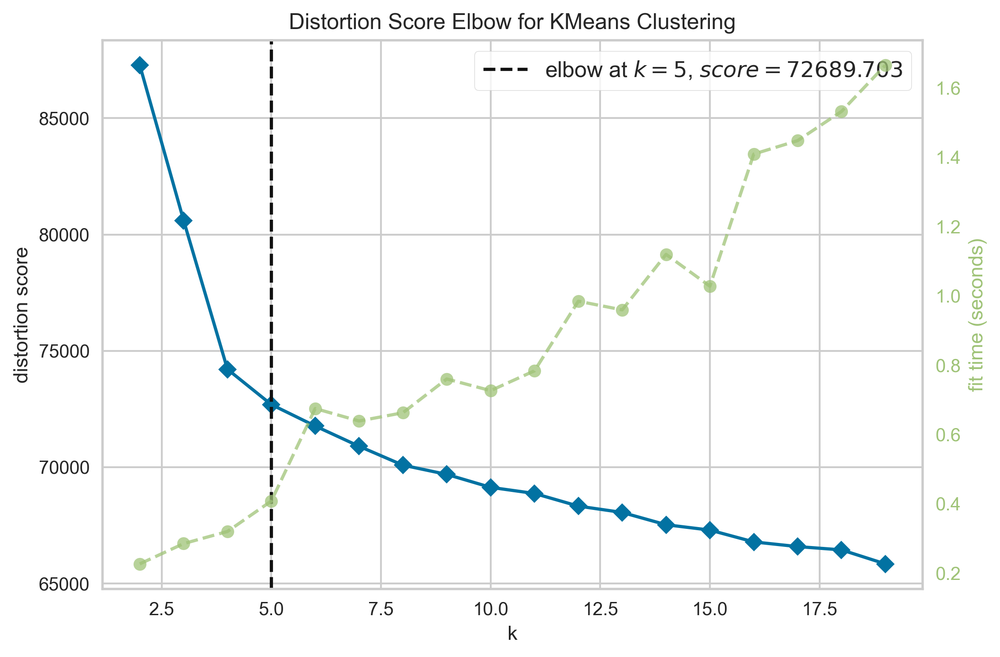

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [340]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from yellowbrick.cluster import KElbowVisualizer

plt.figure(dpi=300)

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2, 20))

visualizer.fit(np.array(X_trans))  # Fit the data to the visualizer
visualizer.show()

In [175]:
model = KMeans(n_clusters=7, random_state=1234)
model.fit(X_trans)
groups = model.predict(X_trans)

In [195]:
genders = [attributes[user].get("gender", np.nan) for user in users]
mask = ~pd.isna(genders)
genders = pd.Series(genders)[mask].values

races = [attributes[user].get("race", np.nan) for user in users]
mask = ~pd.isna(races)
races = pd.Series(races)[mask].values

X_trans = X_trans[mask]

df = pd.DataFrame(X_trans)
df["gender"] = genders
df["race"] = races
df["group"] = groups.astype(str)
df = df.rename(columns={0: "x", 1: "y"})

df_fairwalk = df.groupby(["group", "gender"])["x"].count().reset_index()

In [196]:
df.to_csv("./fairwalk_embeddings.csv", index=False)

In [222]:
import plotly.express as px
import plotly.graph_objects as go

colors = ["#003f5c", "#374c80", "#7a5195", "#bc5090", "#ef5675", "#ff764a", "#ffa600"]
opacity = 0.7
# To generate sharp images, use this
# fig = px.scatter(df, x="x", y="y", color="group", render_mode="svg")
fig = px.scatter(df, x="x", y="y", color="group", color_discrete_sequence=colors)

fig.update_traces(
    marker=dict(
        size=10,
        opacity=opacity,
        line=dict(width=1, color="#f8f8f8"),
        symbol=[
            "triangle-up" if d["gender"] == "f" else "circle"
            for d in df.to_dict("records")
        ],
    ),
    selector=dict(mode="markers"),
    showlegend=False,
)

for i in range(7):
    fig.add_trace(
        go.Scatter(
            x=[-1000],
            y=[-1000],
            legendgroup=str(i),  # this can be any string, not just "group"
            name=f"{i} - female",
            mode="markers",
            marker=dict(
                opacity=opacity, symbol="triangle-up", size=10, color=colors[i]
            ),
        )
    )

    fig.add_trace(
        go.Scatter(
            x=[-1000],
            y=[-1000],
            legendgroup=str(i),  # this can be any string, not just "group"
            name=f"{i} - male",
            mode="markers",
            marker=dict(opacity=opacity, symbol="circle", size=10, color=colors[i]),
        )
    )

fig.update_xaxes(range=[df.describe()["x"]["min"] - 10, df.describe()["x"]["max"] + 10])
fig.update_yaxes(range=[df.describe()["y"]["min"] - 10, df.describe()["y"]["max"] + 10])

fig.update_layout(width=768, height=512, legend={"itemsizing": "constant"})
fig.show(renderer="png")

ValueError: 
For some reason plotly.py was unable to communicate with the
local orca server process, even though the server process seems to be running.

Please review the process and connection information below:

orca status
-----------
    state: running
    executable: /Users/chengluli/anaconda3/envs/ds/bin/orca
    version: 1.3.1
    port: 50880
    pid: 63002
    command: ['/Users/chengluli/anaconda3/envs/ds/bin/orca', 'serve', '-p', '50880', '--plotly', '/Users/chengluli/anaconda3/envs/ds/lib/python3.7/site-packages/plotly/package_data/plotly.min.js', '--graph-only', '--mathjax', 'https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.5/MathJax.js']




In [220]:
fig.write_image("./fairwalk_embedding.png", width=1025, height=768, scale=5)

KeyboardInterrupt: 

In [178]:
from scipy.stats import chi2_contingency, chisquare

female_percentage = 4489 / (4777 + 4489)
male_percentage = 4777 / (4777 + 4489)
overrepresented_percentage = 6980 / (6980 + 2286)
underrepresented_percentage = 2286 / (6980 + 2286)

table = []
expected = []
for group in df_fairwalk["group"].unique():
    data = df_fairwalk[df_fairwalk["group"] == group]
    total = data["x"].sum()
    female = data[data["attribute"] == "f"].get("x").values[0]
    male = data[data["attribute"] == "m"].get("x").values[0]
    table.append([female, male])
    expected.append([total * female_percentage, total * male_percentage])
    stats, pval = chisquare(
        [female, male], f_exp=[total * female_percentage, total * male_percentage]
    )
    print(
        f'For group {group}, there are {female} females and {male} males. Results are {"significant" if pval <= 0.05 else "NON-significant"}, p={pval}'
    )

For group 0, there are 619 females and 980 males. Results are significant, p=6.769230314255021e-15
For group 1, there are 710 females and 686 males. Results are NON-significant, p=0.07115091800045671
For group 2, there are 709 females and 717 males. Results are NON-significant, p=0.33588798939957476
For group 3, there are 688 females and 641 males. Results are significant, p=0.01537170520835049
For group 4, there are 480 females and 517 males. Results are NON-significant, p=0.8489252490689276
For group 5, there are 578 females and 593 males. Results are NON-significant, p=0.5316027474448419
For group 6, there are 705 females and 643 males. Results are significant, p=0.00463734538423287


### Repeated Fairness Metrics

#### Representation Bias

In [190]:
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV, train_test_split
from tqdm import tqdm

rb_results = []
for attribute in tqdm(["gender", "race"]):
    for model in tqdm(["fair-ne", "node2vec", "fairwalk"]):
        # Gather the user embeddings.
        if model == "fair-ne":
            X = debayes.get_embeddings(ids=users)
        else:
            wv = KeyedVectors.load_word2vec_format(
                f"./{model}_embeddings.emb", binary=False
            )
            X = []
            for user in users:
                X.append(wv.get_vector(user))
        Y = pd.Series([attributes[user].get(attribute, np.nan) for user in users])
        mask = ~pd.isna(Y)
        X = np.array(X)
        X = X[mask]
        Y = Y.dropna().values

        for iterration in tqdm(range(0, 200)):
            # Split the embeddings into train and test examples.
            X_train, X_test, Y_train, Y_test = train_test_split(
                X, Y, test_size=0.3, stratify=Y, random_state=iterration
            )

            logi_reg = model_selection.GridSearchCV(
                pipeline.Pipeline(
                    [
                        ("scaler", preprocessing.StandardScaler()),
                        (
                            "logi",
                            linear_model.LogisticRegression(
                                multi_class="ovr",
                                solver="saga",
                                max_iter=1000,
                                random_state=1234,
                            ),
                        ),
                    ]
                ),
                param_grid={},
                cv=3,
                scoring="roc_auc_ovr_weighted",
            )

            logi_reg.fit(X_train, Y_train)
            clf = logi_reg.best_estimator_

            clf.fit(X_train, Y_train)

            test_score = metrics.get_scorer("roc_auc_ovr_weighted")(clf, X_test, Y_test)

            rb_results.append(
                dict(
                    model=model,
                    representation_bias=test_score,
                    iterration=iterration,
                    attribute=attribute,
                )
            )
#             print("The TEST AUC for predicting {} is {}.".format(attribute, test_score))

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 1/200 [00:00<01:53,  1.75it/s]

  1%|          | 2/200 [00:01<01:48,  1.82it/s]

  2%|▏         | 3/200 [00:02<03:14,  1.01it/s]

  2%|▏         | 4/200 [00:03<03:04,  1.06it/s]

  2%|▎         | 5/200 [00:04<03:03,  1.06it/s]

  3%|▎         | 6/200 [00:05<03:12,  1.01it/s]

  4%|▎         | 7/200 [00:06<02:59,  1.08it/s]

  4%|▍         | 8/200 [00:07<02:46,  1.15it/s]

  4%|▍         | 9/200 [00:08<03:11,  1.00s/it]

  5%|▌         | 10/200 [00:09<03:08,  1.01it/s]

  6%|▌         | 11/200 [00:10<03:03,  1.03it/s]

  6%|▌         | 12/200 [00:11<03:10,  1.01s/it]

  6%|▋         | 13/200 [00:12<03:08,  1.01s/it]

  7%|▋         | 14/200 [00:13<02:55,  1.06it/s]

  8%|▊         | 15/200 [00:14<02:56,  1.05it/s]

  8%|▊         | 16/200 [00:14<02:35,  1.18it/s]

  8%|▊         | 17/200 [00:15<02:41,  1.13it/s]

  9%|▉         | 18/200 [00:16<02:38,  1.15it/s]

 10%|▉         | 19/200 [00:1

In [193]:
pd.DataFrame(rb_results).to_csv("./repeated_representation_bias.csv", index=False)

In [15]:
df_rb = pd.read_csv("./repeated_representation_bias.csv")
df_rb_stats = df_rb.groupby(["attribute", "model"])["representation_bias"].describe()
df_rb_stats

count      mean       std       min       25%       50%  \
attribute model                                                               
gender    fair-ne   200.0  0.538633  0.009331  0.512459  0.532762  0.538616   
          fairwalk  200.0  0.554360  0.008721  0.526352  0.549270  0.554813   
          node2vec  200.0  0.588088  0.008367  0.562915  0.581994  0.587915   
race      fair-ne   200.0  0.508419  0.009882  0.484988  0.501570  0.508630   
          fairwalk  200.0  0.584236  0.010408  0.558814  0.577208  0.584328   
          node2vec  200.0  0.564859  0.010099  0.531212  0.558541  0.565098   

                         75%       max  
attribute model                         
gender    fair-ne   0.544973  0.561017  
          fairwalk  0.559624  0.574683  
          node2vec  0.593991  0.610410  
race      fair-ne   0.515645  0.533336  
          fairwalk  0.590771  0.613016  
          node2vec  0.571969  0.593029

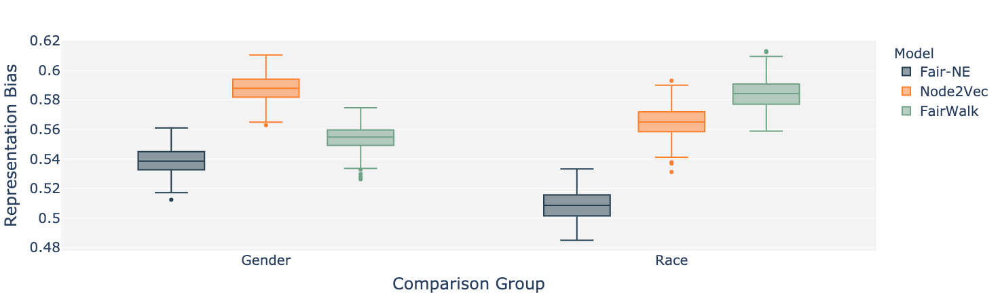

In [31]:
import plotly.express as px

df_rb = pd.read_csv("./repeated_representation_bias.csv")

df_rb["model"] = df_rb["model"].replace(
    {"fair-ne": "Fair-NE", "node2vec": "Node2Vec", "fairwalk": "FairWalk"}
)
df_rb["attribute"] = df_rb["attribute"].str.capitalize()

df_rb = df_rb.rename(
    columns={
        "representation_bias": "Representation Bias",
        "attribute": "Comparison Group",
        "model": "Model",
    }
)
fig = px.box(
    df_rb,
    x="Comparison Group",
    y="Representation Bias",
    color="Model",
    color_discrete_sequence=["#233d4d", "#fe7f2d", "#70a288"],  # LAK22 Only
)
fig.update_layout(
    font=dict(size=20), plot_bgcolor="#F3F3F3",  # LAK22 Only
)
fig.show()
fig.write_image("./representation_bias.png", width=1024, height=512, scale=5)

#### Balance scores

In [311]:
def balance_calculation(data, centers, mapping):
    """
    Checks fairness for each of the clusters defined by k-centers.
    Returns balance using the total and class counts.

    Args:
        data (list)
        centers (list)
        mapping (list) : tuples of the form (data, center)

    Returns:
        fair (dict) : key=center, value=(sum of 1's corresponding to fairness variable, number of points in center)
    """
    fair = dict([(i, [0, 0]) for i in centers])
    for i in mapping:
        fair[i[1]][1] += 1
        if data[i[0]] == 1:  # MARITAL
            fair[i[1]][0] += 1

    curr_b = []
    for i in list(fair.keys()):
        p = fair[i][0]
        q = fair[i][1] - fair[i][0]
        if p == 0 or q == 0:
            balance = 0
        else:
            balance = min(float(p / q), float(q / p))
        curr_b.append(balance)

    return min(curr_b)

In [327]:
balance_results = []
for model_name in ["fair-ne", "node2vec", "fairwalk"]:
    if model_name == "fair-ne":
        X = debayes.get_embeddings(ids=users)
    else:
        wv = KeyedVectors.load_word2vec_format(
            f"./{model_name}_embeddings.emb", binary=False
        )
        X = []
        for user in users:
            X.append(wv.get_vector(user))

    for n_cluster in tqdm(range(2, 20)):
        model = KMeans(n_clusters=n_cluster, random_state=1234)
        model.fit(X)
        groups = model.predict(X)

        centers = [tuple(center) for center in model.cluster_centers_]
        mapping = [
            [idx, tuple(model.cluster_centers_[group])]
            for idx, group in enumerate(groups)
        ]

        for attribute in ["gender", "race"]:
            if attribute == "gender":
                data = [
                    1 if g == "f" else 0
                    for g in [attributes[user].get(attribute) for user in users]
                ]
            elif attribute == "race":
                data = [
                    1 if g == "underrepresented" else 0
                    for g in [attributes[user].get(attribute) for user in users]
                ]
            else:
                print("hmm...")
                continue

            balance_score = balance_calculation(data, centers, mapping)

            balance_results.append(
                dict(
                    model=model_name,
                    balance_score=balance_score,
                    attribute=attribute,
                    n_cluster=n_cluster,
                )
            )

100%|██████████| 18/18 [00:18<00:00,  1.02s/it]


In [328]:
pd.DataFrame(balance_results).to_csv("./cluster_balance_scores.csv", index=False)

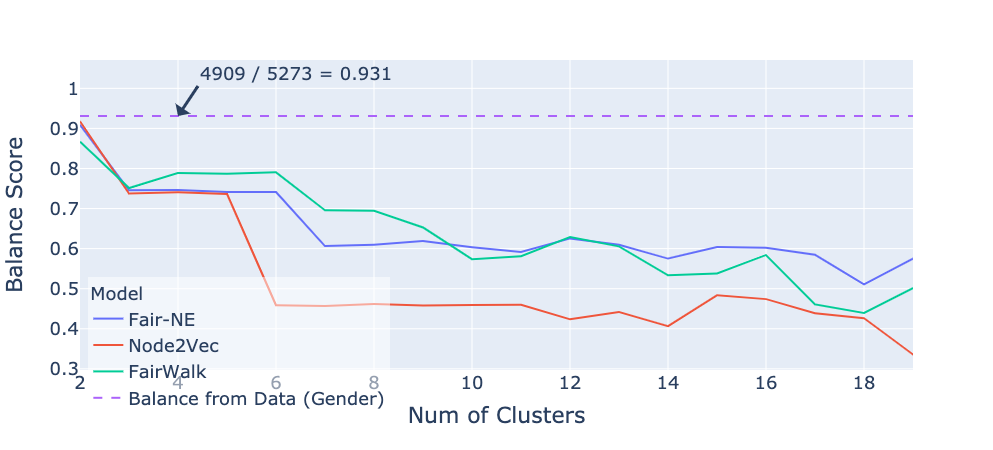

In [382]:
import plotly.express as px
import plotly.graph_objects as go

df_balance = pd.read_csv("./cluster_balance_scores.csv")
df_balance = df_balance.rename(
    columns={
        "model": "Model",
        "n_cluster": "Num of Clusters",
        "balance_score": "Balance Score",
    }
)
df_balance["Model"] = df_balance["Model"].replace(
    {"fair-ne": "Fair-NE", "node2vec": "Node2Vec", "fairwalk": "FairWalk"}
)

fig = px.line(
    df_balance[df_balance["attribute"] == "gender"],
    x="Num of Clusters",
    y="Balance Score",
    color="Model",
)
fig.add_trace(
    go.Line(
        x=list(range(2, 20)),
        y=[4909 / 5273] * 18,
        mode="lines",
        name="Balance from Data (Gender)",
        line={"dash": "dash"},
    )
)
fig.add_annotation(
    x=4,
    y=4909 / 5273,
    ax=20,
    ay=-30,
    text=f"4909 / 5273 = {round(4909 / 5273, 4)}",
    showarrow=True,
    arrowhead=1,
    arrowwidth=3,
    xanchor="left",
    yanchor="bottom",
)
fig.update_layout(
    dict(
        font=dict(size=18),
        legend=dict(
            yanchor="top",
            y=0.3,
            xanchor="left",
            x=0.01,
            bgcolor="rgba(255,255,255, 0.5)",
        ),
    )
)

fig.show()
fig.write_image("./gender_balance.png", width=1024, height=648, scale=5)

#### Repeated Equalized Odds

In [ ]:
results_eq_odds = []
for threshold in tqdm(np.linspace(0, 1, 2000)):
    tmp_eq_odds_gender = defaultdict(lambda: [])
    tmp_eq_odds_race = defaultdict(lambda: [])
    for i in range(0, 50):
        for model in ["Fair-NE", "Node2Vec", "FairWalk"]:
            if model == "Fair-NE":
                _predictions = predictions_debayes
            elif model == "Node2Vec":
                _predictions = predictions_node2vec
            elif model == "FairWalk":
                _predictions = predictions_fairwalk

            predictions_binary = np.array(_predictions) >= threshold
            rand_indices = (
                pd.Series(predictions_binary).sample(frac=0.5, random_state=i).index
            )

            test_labels_eval_filtered = test_labels_eval[rand_indices]
            predictions_binary_filtered = predictions_binary[rand_indices]
            repliers_gender_filtered = repliers_gender[rand_indices]
            repliers_race_filtered = repliers_race[rand_indices]

            has_gender_mask = ~pd.isna(repliers_gender_filtered)
            male_mask = repliers_gender_filtered == "m"

            eq_odds_gender = compute_eq_odds(
                compute_tpr_fpr(
                    test_labels_eval_filtered[has_gender_mask & male_mask],
                    predictions_binary_filtered[has_gender_mask & male_mask],
                ),
                compute_tpr_fpr(
                    test_labels_eval_filtered[has_gender_mask & ~male_mask],
                    predictions_binary_filtered[has_gender_mask & ~male_mask],
                ),
            )

            has_race_mask = ~pd.isna(repliers_race_filtered)
            overrepresented_mask = repliers_race_filtered == "overrepresented"

            eq_odds_race = compute_eq_odds(
                compute_tpr_fpr(
                    test_labels_eval_filtered[has_race_mask & overrepresented_mask],
                    predictions_binary_filtered[has_race_mask & overrepresented_mask],
                ),
                compute_tpr_fpr(
                    test_labels_eval_filtered[has_race_mask & ~overrepresented_mask],
                    predictions_binary_filtered[has_race_mask & ~overrepresented_mask],
                ),
            )

            tmp_eq_odds_gender[model].append(eq_odds_gender)
            tmp_eq_odds_race[model].append(eq_odds_race)

    for model in ["Fair-NE", "Node2Vec", "FairWalk"]:
        _tmp_eq_odds_gender = pd.Series(tmp_eq_odds_gender[model])
        _tmp_eq_odds_race = pd.Series(tmp_eq_odds_race[model])

        results_eq_odds.append(
            dict(
                model=model,
                eq_odds_gender_mean=_tmp_eq_odds_gender.mean(),
                eq_odds_race_mean=_tmp_eq_odds_race.mean(),
                eq_odds_gender_std=_tmp_eq_odds_gender.std(),
                eq_odds_race_std=_tmp_eq_odds_race.std(),
                threshold=threshold,
            )
        )

##### Plot

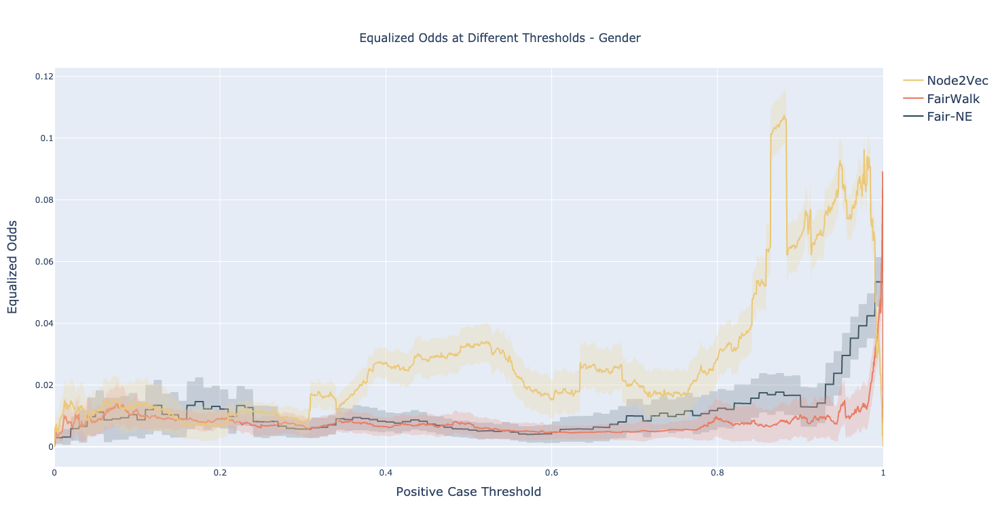

In [174]:
import plotly.express as px
import plotly.graph_objs as go

df_eq_odds = pd.read_csv("./equalized_odds.csv")
fig = go.Figure()

colors = {
    "Fair-NE": {"main": "#264653", "band": "rgba(120,134,141,0.3)"},
    "FairWalk": {"main": "#e76f51", "band": "rgba(236,155,141,0.3)"},
    "Node2Vec": {"main": "#e9c46a", "band": "rgba(238,213,155,0.3)"},
    "rf": {"main": "#2a9d8f", "band": "rgba(202,255,191,0.2)"},
}

attribute = "gender"
for model in ["Fair-NE", "FairWalk", "Node2Vec"]:
    data = df_eq_odds[df_eq_odds["model"] == model]
    x = data["threshold"]
    y = data[f"eq_odds_{attribute}_mean"]
    y_upper = y + data[f"eq_odds_{attribute}_std"]
    y_lower = y - data[f"eq_odds_{attribute}_std"]

    fig.add_trace(
        go.Scatter(
            name=model, x=x, y=y, mode="lines", line=dict(color=colors[model]["main"]),
        )
    )
    fig.add_trace(
        go.Scatter(
            name="Upper Bound",
            x=x,
            y=y_upper,
            mode="lines",
            line=dict(width=0),
            showlegend=False,
        ),
    )
    fig.add_trace(
        go.Scatter(
            name="Lower Bound",
            x=x,
            y=y_lower,
            mode="lines",
            line=dict(width=0),
            showlegend=False,
            fillcolor=colors[model]["band"],
            fill="tonexty",
        )
    )

fig.update_layout(
    width=1024,
    height=768,
    title={
        "text": f"Equalized Odds at Different Thresholds - {attribute.capitalize()}",
        "x": 0.5,
        "xanchor": "center",
        "yanchor": "top",
    },
    legend=dict(font=dict(size=18)),
)
fig.update_xaxes(title=dict(text="Positive Case Threshold", font_size=18,),)
fig.update_yaxes(title=dict(text="Equalized Odds", font_size=18,),)
fig.show()
fig.write_image(f"./eq_odds_{attribute}.png", scale=5)